# Dataset

In [ ]:
import pandas as pd
df = pd.read_excel('/content/EnglishTenseUniqueDataset.xlsx')

In [ ]:
sentence_list = df['Sentence'].tolist()
print(len(sentence_list))

13316


# 2nd TRY

In [ ]:
!pip install scipy

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import scipy.sparse as sp

In [ ]:
sentences = sentence_list

vect = CountVectorizer(stop_words=None, token_pattern=r"(?u)\b\w+\b")
X = vect.fit_transform(sentences)
unique_words = vect.get_feature_names_out()
print(unique_words)
num_unique_words = len(unique_words)
word_to_index = {word: i for i, word in enumerate(unique_words)}
co_mat = sp.lil_matrix((num_unique_words, num_unique_words), dtype=np.float32)
window_len = 5

['1' '100' '1000' ... 'zones' 'zoo' 'zooming']


In [ ]:
print(len(unique_words))

10800


In [ ]:
def make_co_mat(sentences, window_len, word_to_index):
  for sentence in sentences:
    word_list = sentence.split(' ')
    for focus_word_index, focus_word in enumerate(word_list):
      focus_word = focus_word.lower()
      for context_word_index in range(max(focus_word_index - window_len, 0), min(focus_word_index + window_len + 1, len(word_list))):
        context_word = word_list[context_word_index].lower()
        if context_word in word_to_index and context_word != focus_word:
          co_mat_rows_index = word_to_index[focus_word]
          co_mat_cols_index = word_to_index[context_word]
          co_mat[co_mat_rows_index, co_mat_cols_index] += 1

In [ ]:
make_co_mat(sentences, window_len, word_to_index)
print(co_mat)

  (0, 1824)	1.0
  (0, 7120)	1.0
  (0, 7772)	1.0
  (0, 8833)	1.0
  (0, 9731)	1.0
  (1, 3307)	1.0
  (1, 4919)	1.0
  (1, 6096)	1.0
  (1, 8003)	1.0
  (1, 8749)	1.0
  (1, 9852)	1.0
  (1, 9978)	1.0
  (2, 138)	1.0
  (2, 1994)	1.0
  (2, 6764)	1.0
  (2, 7119)	1.0
  (2, 7659)	1.0
  (2, 10682)	1.0
  (3, 1344)	1.0
  (3, 1590)	1.0
  (3, 4919)	1.0
  (3, 6241)	1.0
  (3, 9731)	1.0
  (3, 10510)	1.0
  (4, 210)	1.0
  (4, 425)	1.0
  (4, 459)	1.0
  (4, 904)	1.0
  (4, 1038)	1.0
  (4, 2304)	1.0
  (4, 3980)	1.0
  (4, 5423)	1.0
  (4, 6599)	1.0
  (4, 6764)	1.0
  (4, 7662)	1.0
  (4, 8511)	1.0
  (4, 9731)	3.0
  (4, 9852)	1.0
  (4, 10283)	1.0
  (5, 138)	1.0
  (5, 865)	1.0
  (5, 3902)	1.0
  (5, 4919)	2.0
  (5, 5879)	1.0
  (5, 7155)	1.0
  (5, 8749)	1.0
  (5, 9183)	1.0
  (5, 9874)	1.0
  (6, 968)	3.0
  (6, 1079)	1.0
  (6, 1388)	6.0
  (6, 1588)	1.0
  (6, 2754)	2.0
  (6, 3324)	1.0
  (6, 4320)	1.0
  (6, 4521)	5.0
  (6, 4831)	1.0
  (6, 5220)	1.0
  (6, 5646)	1.0
  (6, 6128)	1.0
  (6, 7791)	1.0
  (6, 8450)	1.0
  (6, 9542)	1

In [ ]:
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(n_components=15, random_state=42)
co_mat_reduced = svd.fit_transform(co_mat)

explained_variance = svd.explained_variance_ratio_.sum()
print(f"Explained Variance Retained After SVD: {explained_variance:.2f}")

Explained Variance Retained After SVD: 0.97


In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2, random_state=42)
word_embeddings_2D = pca.fit_transform(co_mat_reduced)

print(f"Variance Explained by 2D PCA: {pca.explained_variance_ratio_.sum():.2f}")

Variance Explained by 2D PCA: 0.76


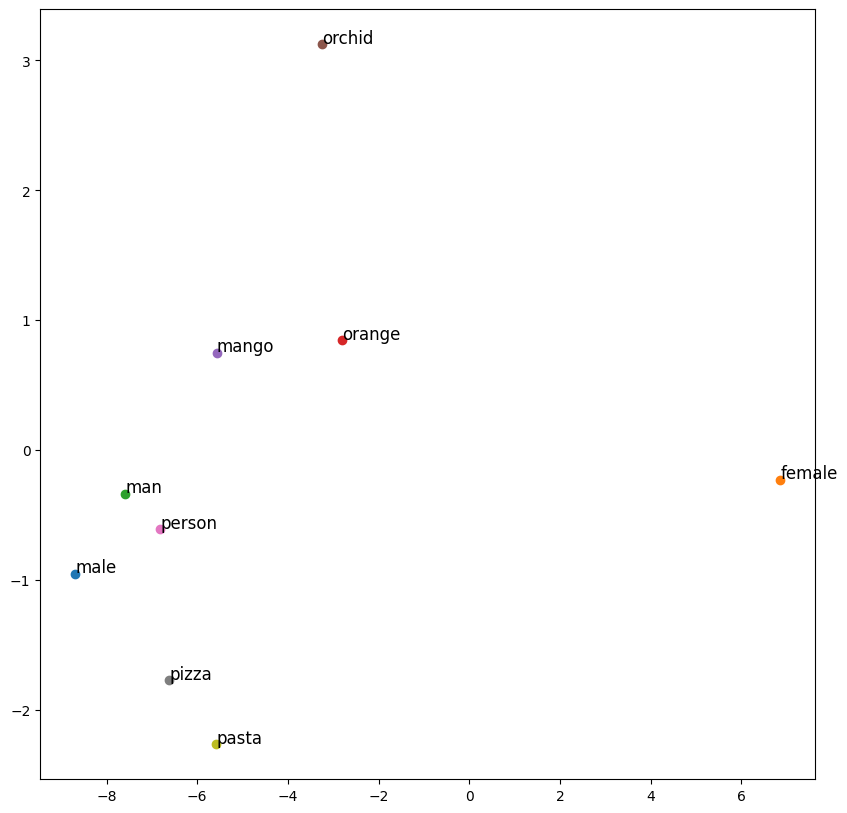

In [ ]:
import matplotlib.pyplot as plt

words_to_visualize = ["male", "female", "man","orange", "mango", "orchid", "person", "pizza", "pasta"]
indices = [word_to_index[word] for word in words_to_visualize]

plt.figure(figsize=(10, 10))
for i in indices:
    plt.scatter(word_embeddings_2D[i, 0], word_embeddings_2D[i, 1])
    plt.text(word_embeddings_2D[i, 0]+0.01, word_embeddings_2D[i, 1]+0.01, unique_words[i], fontsize=12)

plt.show()



In [ ]:
for i, word in enumerate(unique_words):
    print(f"{word}: {i}")


Streaming output truncated to the last 5000 lines.
maintained: 5800
maintaining: 5801
maintenance: 5802
majestic: 5803
majestically: 5804
major: 5805
majorana: 5806
majors: 5807
make: 5808
makebelieve: 5809
maker: 5810
makers: 5811
makes: 5812
makeshift: 5813
maki: 5814
making: 5815
male: 5816
maledominated: 5817
malfunctioned: 5818
malfunctioning: 5819
malicious: 5820
mall: 5821
malls: 5822
malt: 5823
malware: 5824
mammals: 5825
man: 5826
manage: 5827
managed: 5828
management: 5829
managers: 5830
managing: 5831
mandatory: 5832
maneuvering: 5833
mango: 5834
mangrove: 5835
mangroves: 5836
manifold: 5837
maninthemiddle: 5838
manipulate: 5839
manipulated: 5840
manipulating: 5841
manipulation: 5842
manta: 5843
mantel: 5844
manufacturers: 5845
manufacturing: 5846
manure: 5847
manuscript: 5848
many: 5849
map: 5850
maple: 5851
mapped: 5852
mapping: 5853
maps: 5854
mar: 5855
marathon: 5856
marathons: 5857
marble: 5858
march: 5859
marches: 5860
mardin: 5861
margin: 5862
marginalized: 5863
margi

# Comparision

In [ ]:
import numpy as np
import gensim.downloader as api

glove = api.load("glove-wiki-gigaword-100")
glove_embeddings = np.array([glove[word] if word in glove else np.zeros(100) for word in words_to_visualize])


In [ ]:
pca_glove = PCA(n_components=2)
glove_embeddings_2d = pca_glove.fit_transform(glove_embeddings)

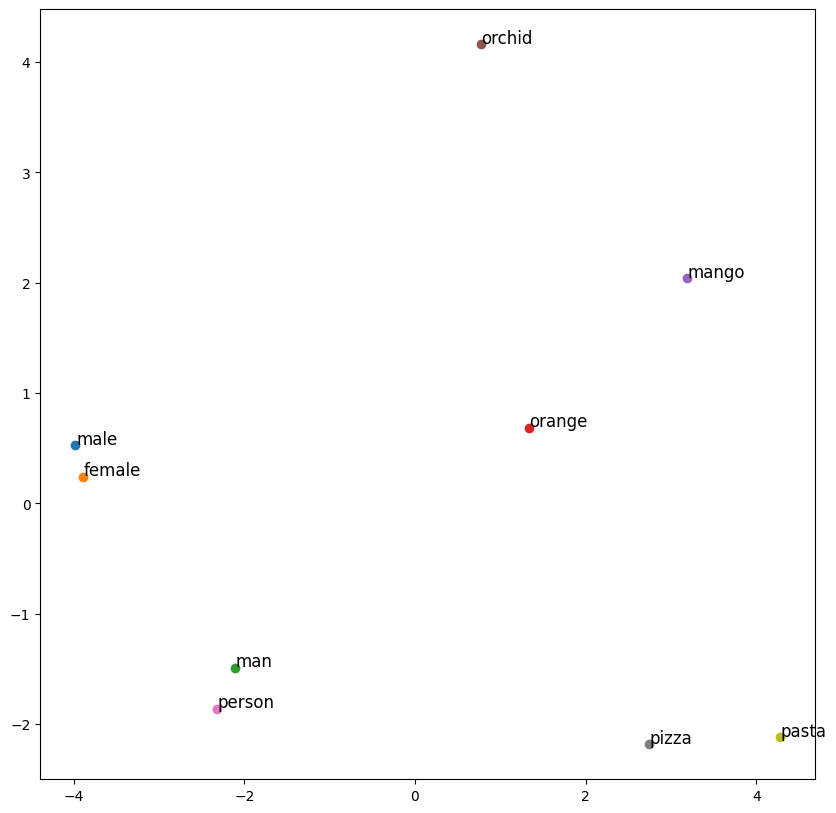

In [ ]:
plt.figure(figsize=(10, 10))
for i, word in enumerate(words_to_visualize):
    plt.scatter(glove_embeddings_2d[i, 0], glove_embeddings_2d[i, 1])
    plt.text(glove_embeddings_2d[i, 0]+0.01, glove_embeddings_2d[i, 1]+0.01, word, fontsize=12)

plt.show()

In [ ]:
word2vec = api.load("word2vec-google-news-300")

word2vec_embeddings = np.array([word2vec[word] if word in word2vec else np.zeros(300) for word in words_to_visualize])

pca_word2vec = PCA(n_components=2)
word2vec_embeddings_2d = pca_word2vec.fit_transform(word2vec_embeddings)

[==================================================] 100.0% 1662.8/1662.8MB downloaded


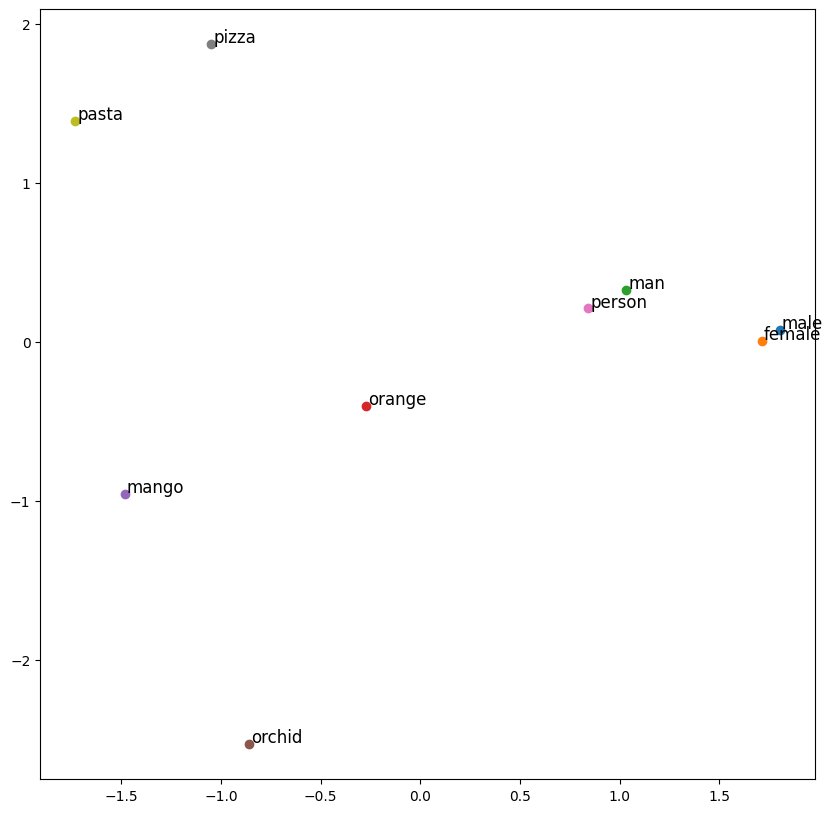

In [ ]:
plt.figure(figsize=(10, 10))
for i, word in enumerate(words_to_visualize):
    plt.scatter(word2vec_embeddings_2d[i, 0], word2vec_embeddings_2d[i, 1])
    plt.text(word2vec_embeddings_2d[i, 0]+0.01, word2vec_embeddings_2d[i, 1]+0.01, word, fontsize=12)

plt.show()